# TMA Image Analysis
This notebook shows how to use the `TMA Image Analysis` components of `napari-prism` to process and measure the raw .qptiff tissue microarray image into a structured {class}`anndata.AnnData` object containing cell level information.

We continue on with the NSCLSC4301 dataset from the [previous section](./getting_started.ipynb), already loaded and parsed into a SpatialData .zarr file.

In [1]:
# Below code loads napari to notebook for screenshot purposes
# All functions done on the viewer window3
import warnings

import matplotlib.pyplot as plt
import napari
from IPython import get_ipython
from loguru import logger


class ScreenshotContext:
    def __enter__(self):
        get_ipython().run_line_magic("matplotlib", "inline")

    def __exit__(self, exc_type, exc_value, traceback):
        get_ipython().run_line_magic("matplotlib", "qt")


plt.rcParams["figure.figsize"] = (20, 20)
warnings.filterwarnings("ignore")
logger.remove()
viewer = napari.current_viewer() or napari.Viewer()

## Masking

The first plug-and-play operation we perform is image masking. Image masking is done to generate a more discrete representation of where the TMA cores are by doing this on a ubiquitious cell nuclei marker like `DAPI`.

We currently provide a mini-pipeline for generating image masks, comprised of a sequence of the following operations:
1. A gaussian blur with a sigma/spread equal to a user set size (here in um, converted to px)
2. An expansion of the blur by user set size (um)
3. A series of user-tickable optional operations (in below order):
- Li Thresholding
- 2D sobel / edge filter
- Local histogram equalisation
- Gamma correction (0.2 value)

The outputs are:
1) A binary mask
2) A thresholded polygon representation of the binary mask

### Steps 

1. Select the `DAPI` var in the `View (napari-spatialdata)` widget
1. Select the `TMA Image Analysis (napari-prism)` widget tab on the bottom-right

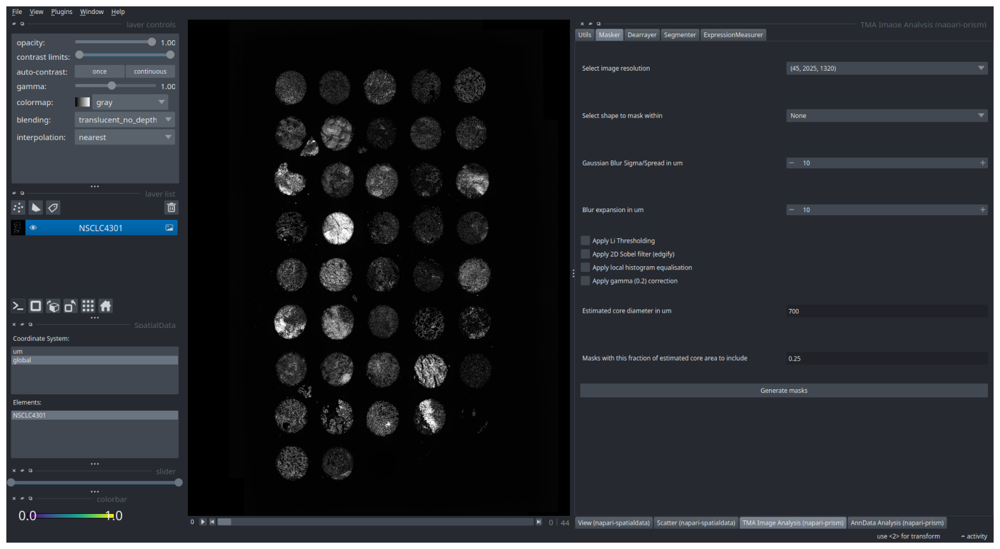

In [2]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

3. Select an image resolution (Channels, Y pixels, X pixels) to perform image masking. Recommended to do this on the lowest resolution (45, 2025, 1320):

<p align="center">
  <img src="../_static/notebook_images/masking_resolution.png" />
</p>


### (Optional) Constrain the masking operation to a bounding box

4. Create a new `Shapes` layer by selecting the polygon icon <img src="../_static/notebook_images/shapes_napari_icon.png" width="25"> in the layer list
5. . (Optional) rename this layer by double-clicking the layer name, typing a new name (i.e. `bounding_box`), then Enter
6. Create a rectangle shape in this layer by selecting the 4-pointed square icon <img src="../_static/notebook_images/rectangle_napari_icon.png" width="25"> in the layer controls. Adjust the opacity to make more transparent.
7. Reselect the `NSCLSC4301` layer
8. In `Select shape to mask within` of the Masker widget tab, select the named shape layer (`bounding_box`)

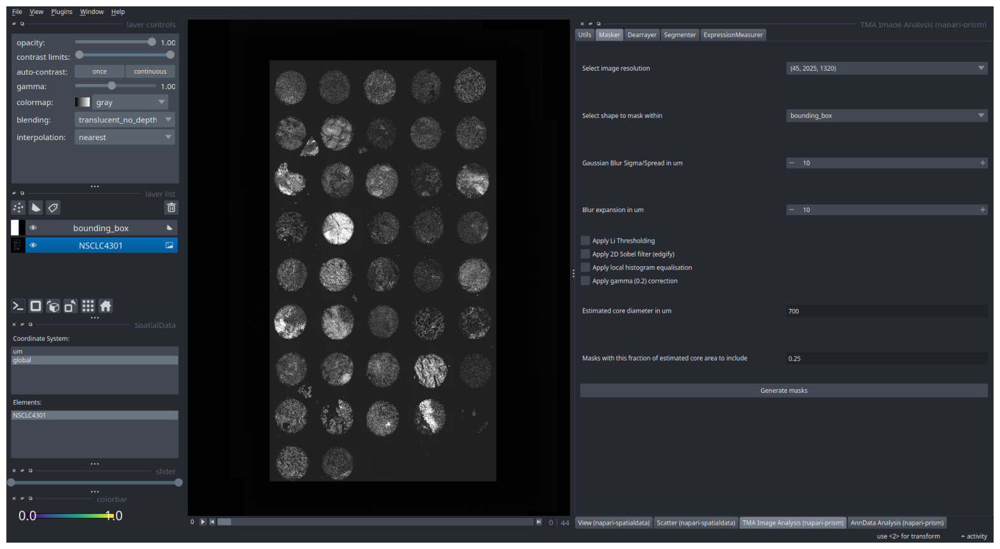

0


In [3]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

9. Choose masking parameters. Below are some recommendations:
- `Gaussian Blur Sigma in um`: 10
- `Blur expansion in um`: 10
- `Li Thresholding`: Only if the image has high background 
- `2D sobel / edge filter`: Only for very blurry images by highlighting edges 
- `Local histogram equalisation`: Only if the image has noticeable variation in intensity across the image
- `Gamma correction (0.2 value)`: Only if intensities are very low

10. Provide mask polygon parameters:
- `Estimated core diameter in um`: This will compute and an estimate for the expected area of the TMA cores.
- `Masks with this fraction of estimate core area to include`: Parts of the mask with less than this fraction of the estimated core area will be removed from the polygon representation.

11. Click `Generate masks`
12. channel_mask and channel_mask_poly will appear in the `Elements` list at the bottom left
13. Double click them to visualise in the layer 

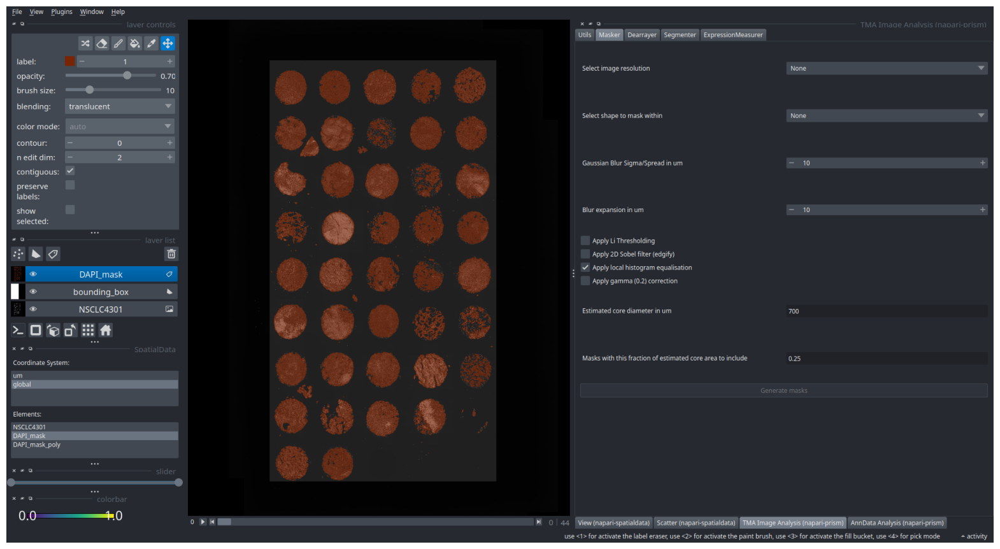

0


In [4]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

The masks appear to be more fragmented in the cores with more sparsely spaced cells (nuclei). We can try to amend this by increasing the gaussian blur and/or expansion to 30:

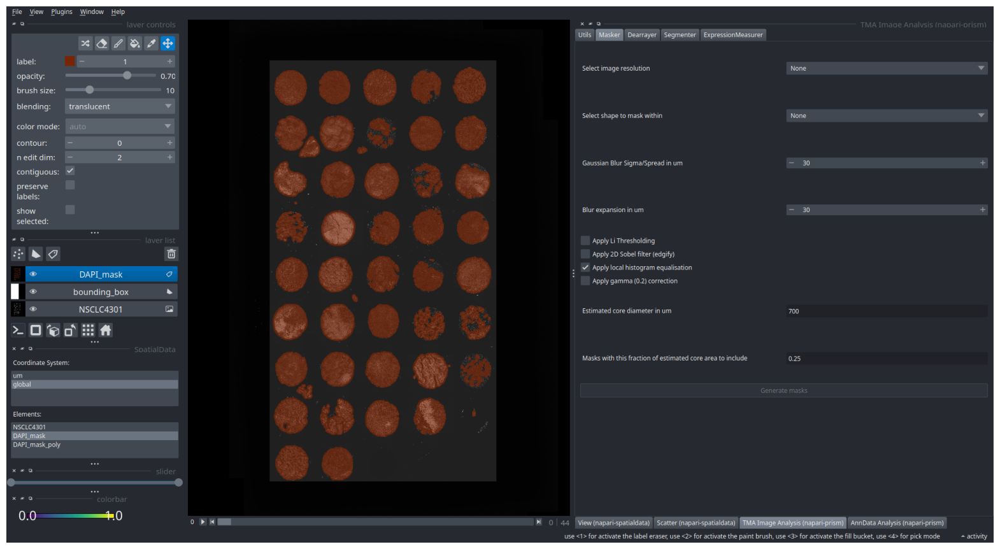

0


In [5]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

The bottom right core masks seem to miss out on some cells. Let's try removing the histogram equalisation, and instead add the sobel filter:

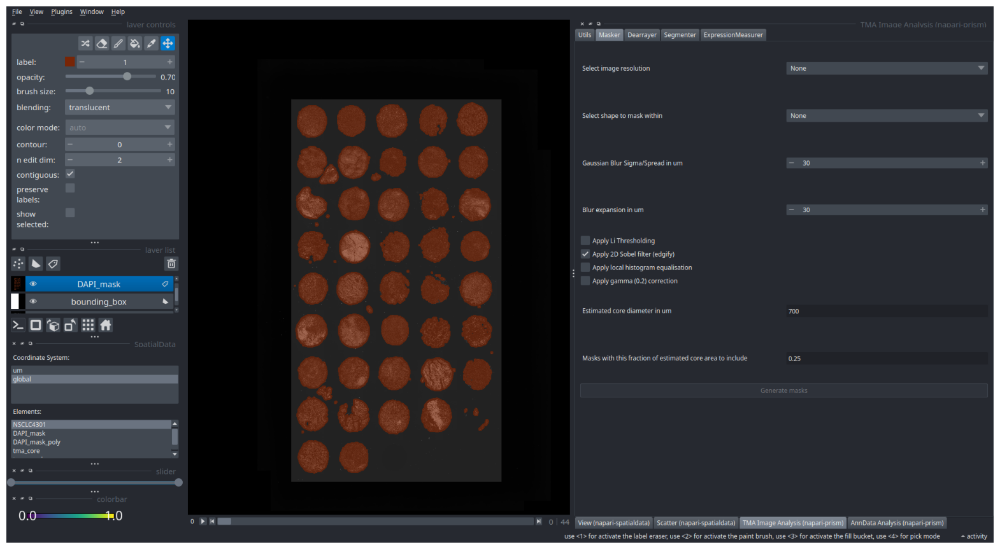

In [2]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

## Dearraying
Dearraying is a central step for segmenting and assigning labels to cores according to the grid of the tissue microarray. This is important as this is is how metadata (i.e. clinical metadata, patient information, disease state, etc) to each core is mapped. 

We currently provide a minimal and oversimplified dearraying algorithm to perform TMA dearraying:
- Blob detection with the Difference of Gaussians (DoG) on the binary masks from the previous step
- Estimation of the TMA grid using the detected blobs
- Fitting of TMA grid labels to each blob

The outputs of this are:
1) TMA core circle shapes
2) Rectangles encompassing the circle shapes AND the mask
3) Tables annotating 1 and 2

### Steps
1. Select the `Dearrayer` tab at the top of the widget
2. Select the binary mask layer in the layer list (`DAPI_mask`). This will show up as the `Selected layer`.
3. Input an estimated or known value for core diameters in um, similar to the previous tab 
4. (Optional, but recommended) Input the expected number of rows and column in the TMA grid. 
   - If values are given, one-dimensional KMeans clustering is used to estimate the x and/or y coordinates of each grid element.
   - Otherwise, a rolling-mean with a predefined threshold is used to estimate x and y coordinates of each grid element.
5. Click `Dearray`
6. tma_core and tma_envelope will appear in the `Elements` at the bottom left
7. Double click `tma_envelope` to visualise in the layer 

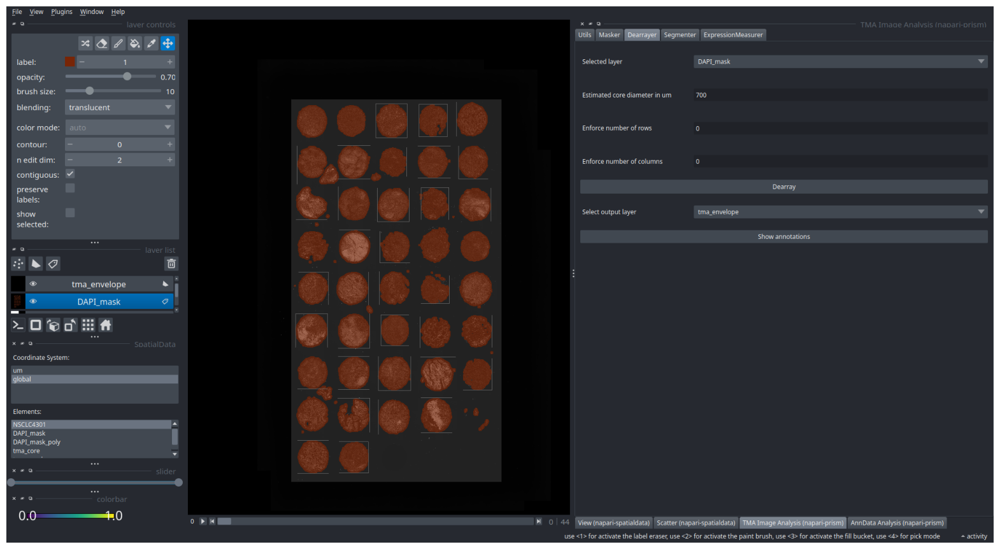

In [3]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

8. For `Select output layer`, select the `tma_envelope` layer to show the annotations
9. Click `Show Annotations`

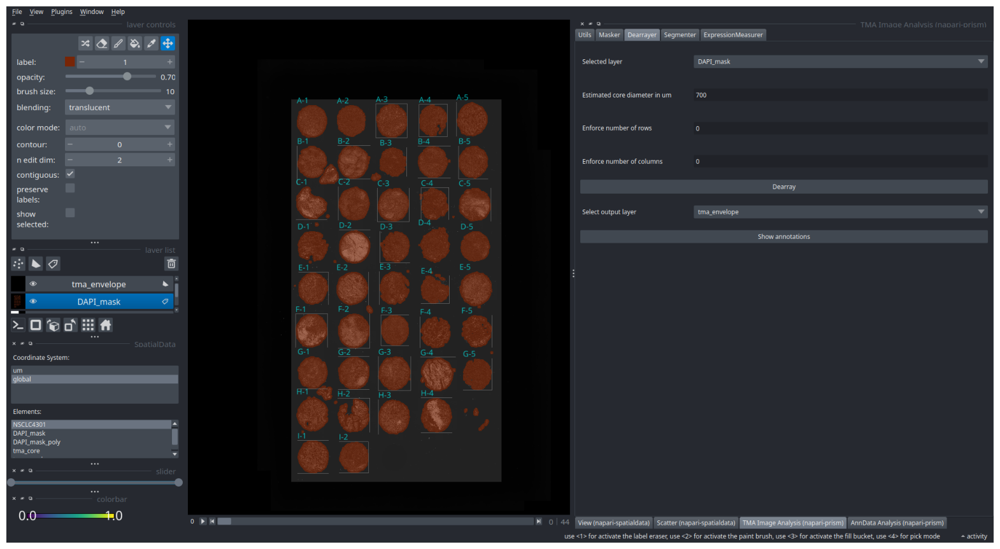

In [4]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()


Note that some of the edges of the boxes may not be rendered at full zoom. Zoom in to see:

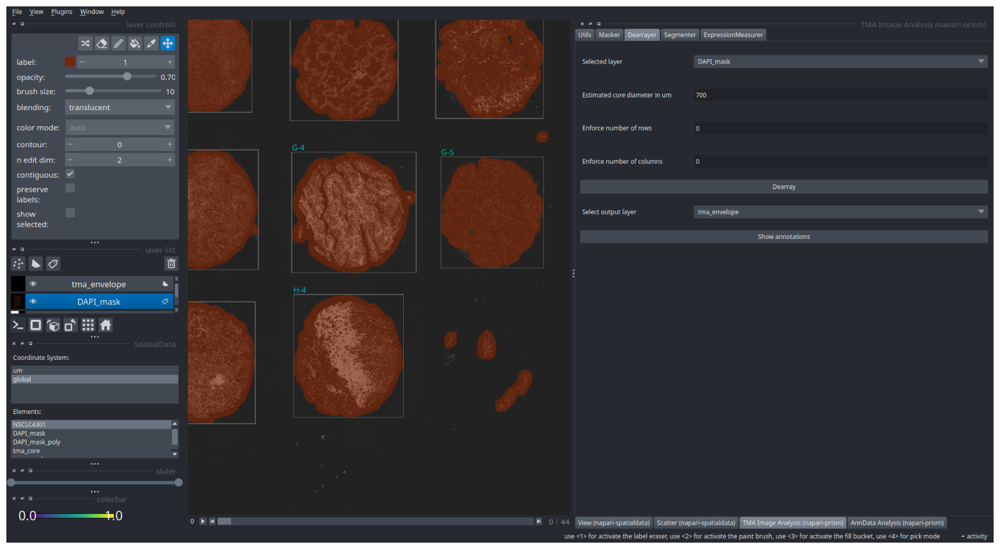

In [5]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

Adjust the boxes as necessary if overlapping or not capturing the core fully (i.e. cores B-1 and B-2):

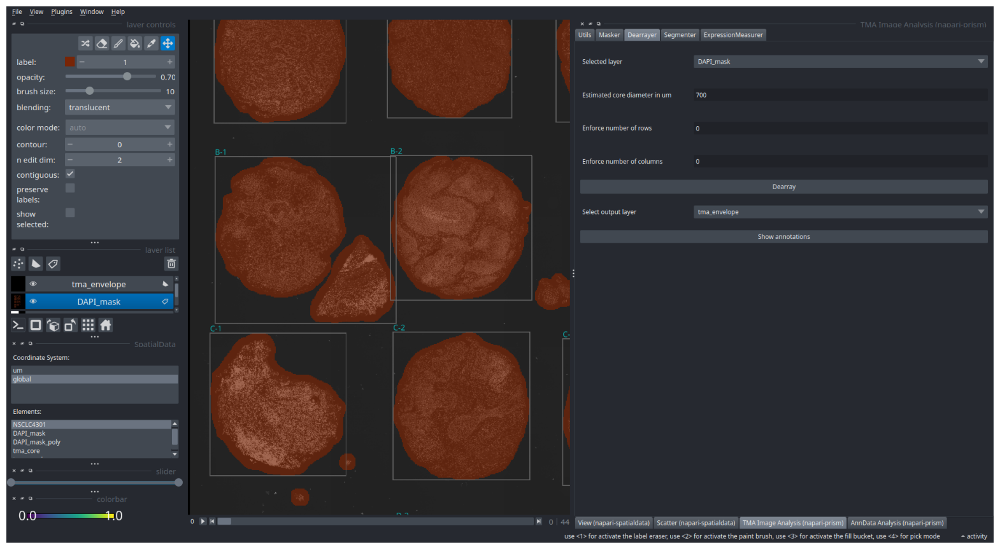

In [6]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

9. Select the `tma_envelope` layer in the layer list
10. Click the select shapes icon <img src="../_static/notebook_images/select_shapes_icon.png" width="20">
11. Click the box to adjust in the viewer

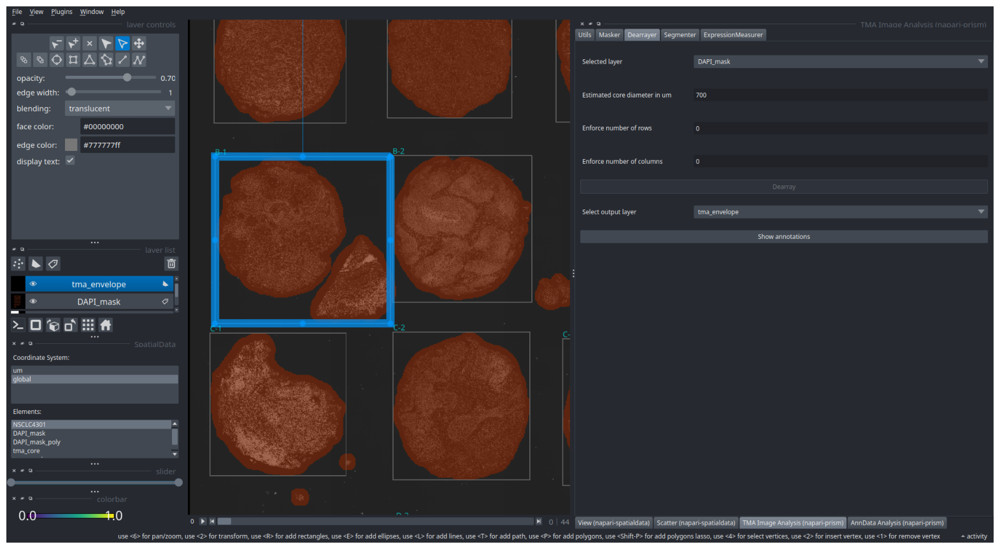

In [7]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

12. Adjust the box:
- Move the box by dragging the centre of the box
- Reshape the box by dragging a corner or edge (white circle)

13. Navigate to the `Utils` tab at the top of the widget
14. Click `Overwrite save selected layer`, with `tma_envelope` selected (this will save the adjustments to disk)

Here we adjust B-1 and B-2 so that the underlying nuclei are contained within their respective cores:

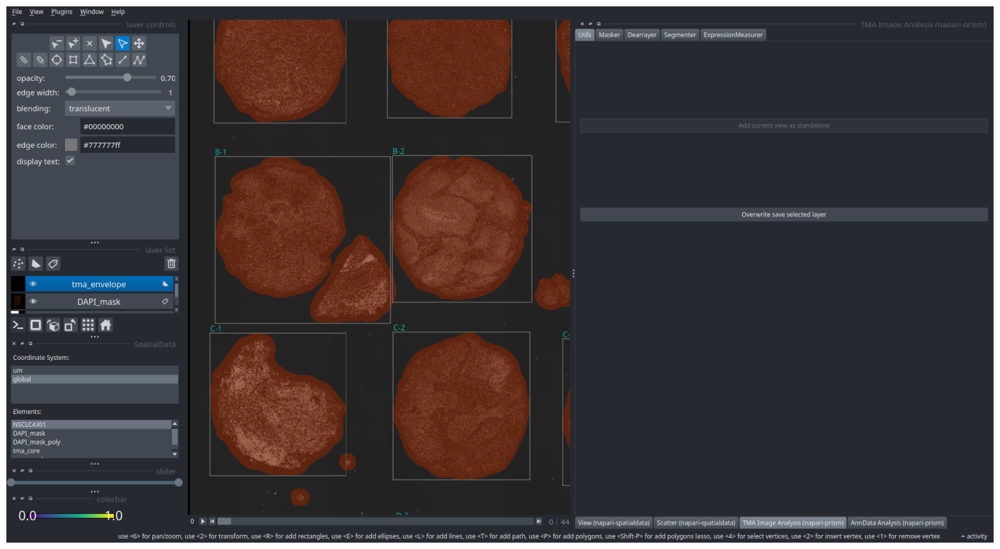

100%|██████████| 25.3M/25.3M [00:15<00:00, 1.72MB/s]


INFO     Transposing `data` of type: <class 'dask.array.core.Array'> to ('y',   
         'x').                                                                  


In [10]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

## Segmenter

Next, we perform cell segmentation on the image. We make this process more efficient by only performing segmentation within the detected TMA cores, skipping over background, or empty/undetected TMA cores. 

In this package, we currently only use and support [cellpose](https://github.com/MouseLand/cellpose) for cell segmentation, and provide a similar interface for controlling segmentation parameters as the [cellpose-napari plugin](https://github.com/MouseLand/cellpose-napari). 

Additionally, we provide functions for creating 'meta-channels' which are merged or intensity projections of multiple user-selected channels. This is useful for performing cytoplasm-based cell segmentation (i.e. cyto3) on images with no single reliable cytoplasmic channel. 

The outputs of this tab are:
1) An instance labelled mask (cell segmentation masks)
2) A table which annotates the labelled mask, containing cell indices, the TMA core label a cell belongs to, and the parent image (NSCLC4301)

At this stage, we have turned off the `DAPI_mask` and `bounding_box` layers to tidy the viewer.

### Steps
1. Select the `Segmenter` tab at the top of the widget
2. Reselect the image layer `NSCLC4301`
3. Select an image resolution (Channels, Y pixels, X pixels) to perform cell segmentation. Recommended to do this on the highest resolution (45, 32400, 21120):

<p align="center">
  <img src="../_static/notebook_images/segmentation_resolution.png" />
</p>

4. Select a base cellpose model (here we use `cyto3`)
5. (Optional) Select a cellpose denoiser model (this overrides the base model selection above). [These models perform image restoration/denoising prior to segmentation](https://www.biorxiv.org/content/10.1101/2024.02.10.579780v2).
6. (Optional) Select a custom cellpose model file (this overrides both model selections above). 
7. Select a shapes layer for tiling: This performs segmentations in discrete regions specified by an annotated shapes layer. This will be the tma_envelopes layer from the previous step. 
8. Select column for tile names: This will be the column in the annotated shapes layer that detail the label of each region. This will be tma_label, containing the string name of each TMA core from the previous step.

<p align="center">
  <img src="../_static/notebook_images/segmenter_params_1.png" />
</p>

9.  Select channel(s) for segmentation. User can select multiple channels for segmentation by holding Ctrl (⌘ on Mac) then left clicking all desired channels.
10. Select a method for merging multiple channels: If multiple channels were selected, these are then merged into a 'meta-channel' by performing an intensity projection across the channel axis. i.e.) "max" performs a maximum intensity projection

Here, we select and merge E-cadherin, Vimentin, and Pan-Cytokeratin (not shown) with a maximum intensity projection:
<p align="center">
  <img src="../_static/notebook_images/segment_multiple_channel.png" />
</p>

11. If supported, then an additional nuclear channel can be specified (i.e. the cyto3 model can take an additional nuclear channel such as DAPI to enhance results).
<p align="center">
  <img src="../_static/notebook_images/segment_nucleus_dapi.png" />
</p>


12. Input a nucleus diameter. If this value is -1, then it is automatically estimated by cellpose. 
13. Cell probability threshold: [Decrease if undersegmenting in dim areas, vice-versa](https://cellpose.readthedocs.io/en/latest/settings.html#cellprob-threshold)
14. Flow threshold: [Decrease if segmentation shapes are unexpected, increase if undersegmenting](https://cellpose.readthedocs.io/en/latest/settings.html#flow-threshold)
15. (Optional, but highly recommended) Tick `First and Last Tile only` to segment the first and last region from the provided tiling shapes layer. This is useful for testing and optimising for segmentation parameters before performing it on the entire image.
16. Click `Run Segmentation`. This button will be greyed out while it is running. When it becomes clickable, it means that segmentation is complete.

<p align="center">
  <img src="../_static/notebook_images/cellpose_params.png" />
</p>

17. After segmentation, the segmentation masks `NSCLC_labels` will appear in the `Elements` list
18. Double click to add and visualise in the viewer:

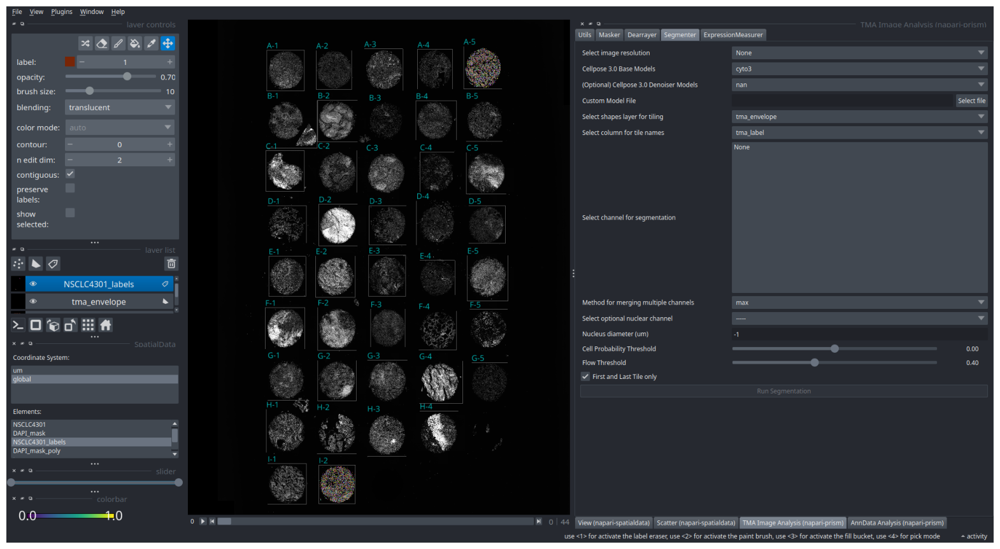

In [11]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

Zooming into A-5 (the 'first' segmented tile):

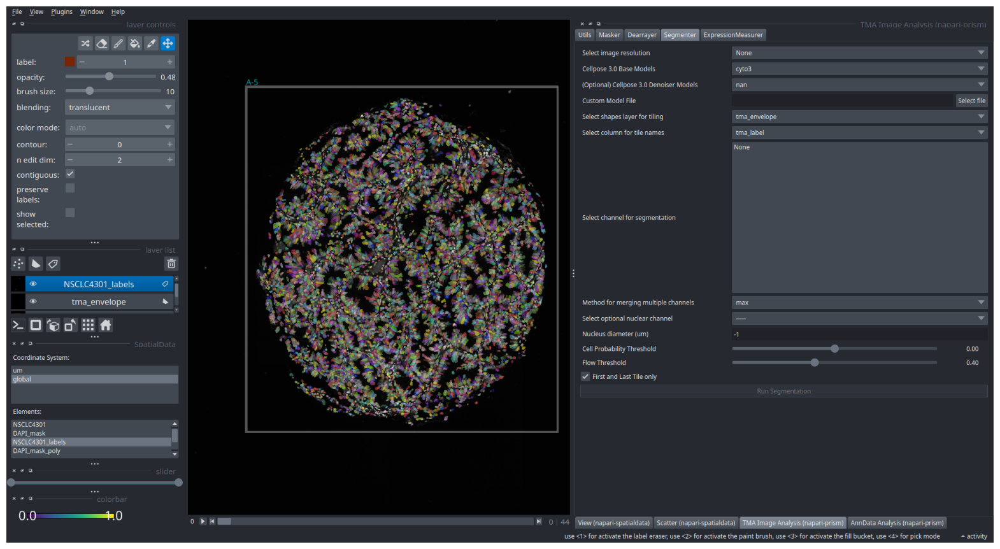

In [12]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

This 'cell-level' segmentation layer will also have a linked {class}`anndata.AnnData` table called `NSCLC4301_labels_tbl` also saved in the SpatialData object. The attributes can be seen and visualised on each cell in the `View (napari-spatialdata)` widget tab.
- index: Cell id or index
- region_label: Label from dearrayer. In this image for example are cells with region_label "I-2"
- lyr: Image layer or name of the parent raw image that segmentation was performed on. In this example, "NSCLC4301"

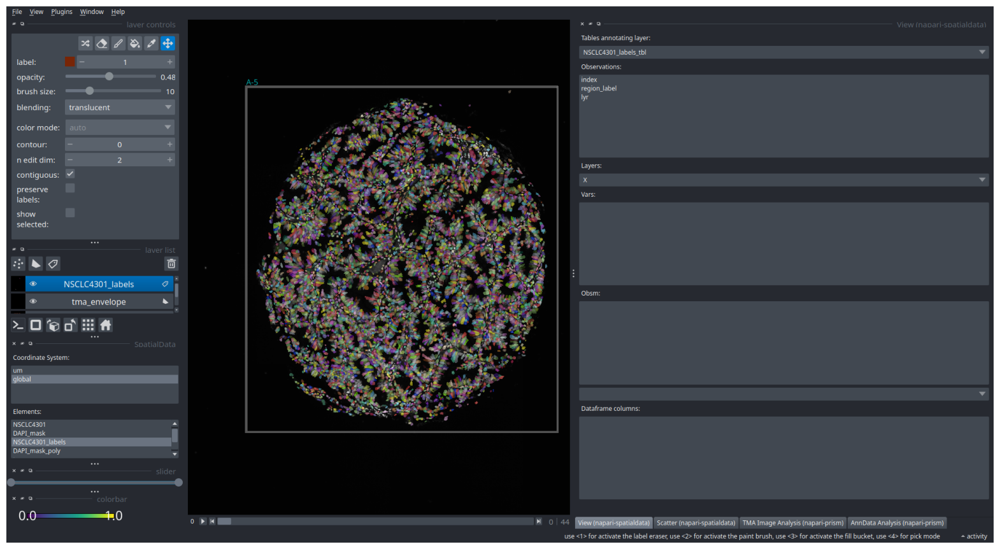

In [13]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

Cells can be colored by 'index' by double clicking this attribute in the Observations widget.
Later, this can be colored by any measured properties within each cell instance.

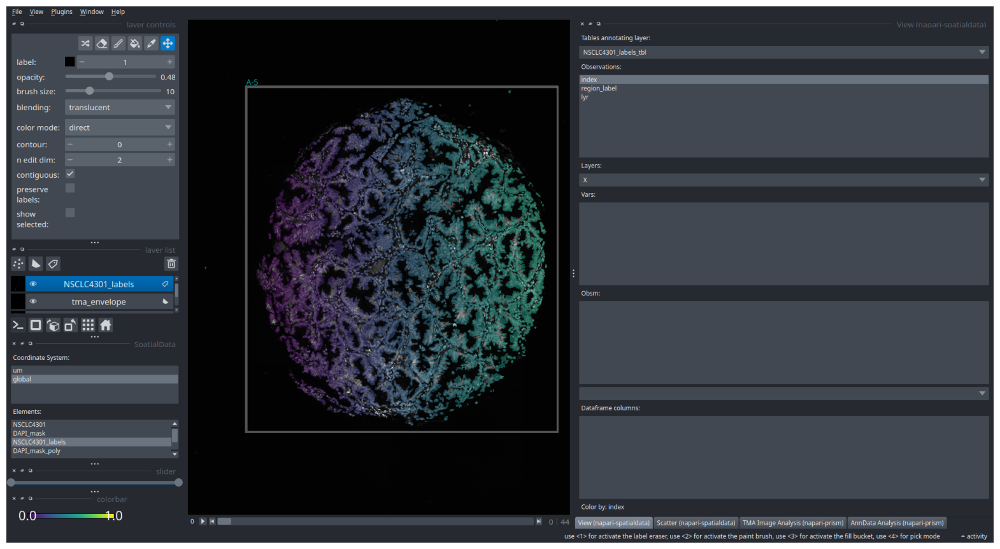

In [14]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

## ExpressionMeasurer

With the segmentation (or even custom) instance labelled masks, image measurements can be made in this tab. 

This process generates a cell-level {class}anndata.AnnData table comprised of 'expression-like' and 'morphological' measurements. 

For each cell/instance, the mean or median intensity of each channel is measured as a proxy for expression levels, alongside other morphological and image properties.

For the sake of example, we will continue with the smaller subset of cells only in the "A-5" and "I-2" core.


### Steps
1. Select the `ExpressionMeasurer` tab at the top of the widget
2. Reselect the image layer in the layer list (NSCLC4301) 
3. Select the segmentation layer containing the cells or instances (NSCLC4301_labels)
4. Select the shapes layer for tiling: the tma_envelope layer.
5. (Optional) Measure extended properties. Hover over this to view the additional image properties to measure on each cell/segmentation instance. 
<p align="center">
  <img src="../_static/notebook_images/additional_image_properties.png" />
</p>

6. Select the intensity modality for quantifying 'expression' of a cell/instance.
7. Click `Measure` (hover over the button to see the entire list of properties measured, by default intensity_mean is shown, but if median is selected will do intensity_median)
<p align="center">
  <img src="../_static/notebook_images/additional_image_properties.png" />
</p>

8. Navigate to the `View (napari-spatialdata)` tab.
9. Reselect the labels layer `NSCLC4301_labels`. Note the new table containing the measured data:

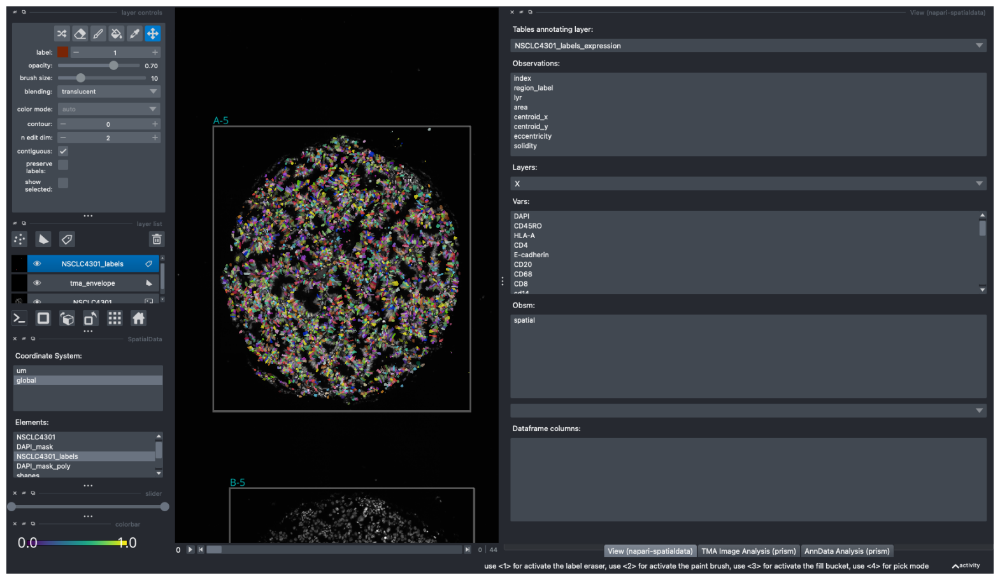

In [15]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

We can visualise by these new attributes (.obs and .var) by double clicking them in this widget, i.e. color by the intensity of NAKATPASE:

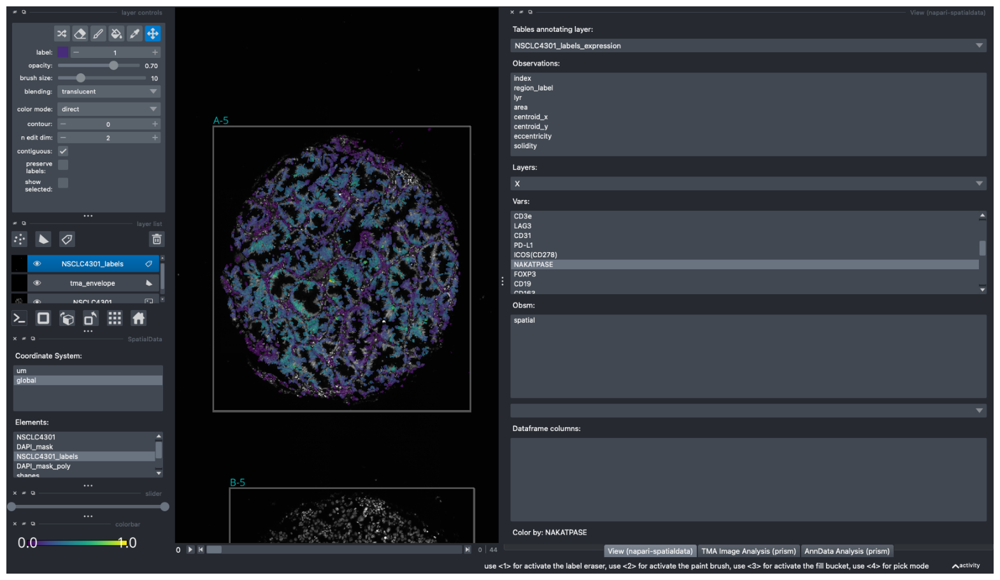

In [16]:
with ScreenshotContext():
    plt.imshow(viewer.screenshot(canvas_only=False))
    plt.axis("off")
    plt.show()

## Next Steps
Currently, there is no need to explicitly save any of the outputs generated in this widget, as (for now) the strategy is to save them directly to the on-disk SpatialData .zarr store with each button press.

The user may continue directly onto the [AnnData analysis section](adata_usage.ipynb). 